COVID-19 World Vaccination Progress 10

In [1]:
import numpy as np 
import pandas as pd 
from datetime import datetime
import os
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

vaccine = pd.read_csv("E:/github/COVID-19 World Vaccination Progress/country_vaccinations.csv")
vaccine['date_new'] = pd.to_datetime(vaccine['date'])
covid=pd.read_csv("E:/github/COVID-19 World Vaccination Progress/worldometer_coronavirus_daily_data.csv")
covid_cum=pd.read_csv("E:/github/COVID-19 World Vaccination Progress/worldometer_coronavirus_summary_data.csv")
covid['date_new'] = pd.to_datetime(covid['date'])

In [2]:
fig = go.Figure(data=go.Choropleth(locations = covid_cum['country'],
                            locationmode='country names',
                            z = covid_cum['total_confirmed'],
                            text = covid_cum['country'],
#                             color_continuous_scale='reds',
                            colorscale = 'RdBu',
                            autocolorscale=False,
#                             reversescale=True,
                            marker_line_color='darkgray',
                            marker_line_width=0.5,
                        
                          ))

fig.update_layout(
    title_text='Total confirmed cases around the world',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    ))
fig.show()

The worst hit countries by total confirmed cases would be:

In [3]:
covid_cum_top_10 = covid_cum[['country','total_confirmed']].sort_values('total_confirmed')[-10:]
fig = go.Figure(go.Bar(
            x=covid_cum_top_10['total_confirmed'],
            y=covid_cum_top_10['country'],
    marker_color = ['#00296f']* 10,
    text = covid_cum_top_10['total_confirmed'],
            orientation='h')
               ,layout=go.Layout(height=500, width=700))
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(title_text='Top 10 countries by total confirmed case',xaxis_title='total confirmed cases')
fig.show()


    USA leads by cases over 30 million. It is also worth noting that the total number of cases in America are atleast twice of the succeding countries.
    India and Brazil follow with 15 million cases reported which are again twice the number of cases of the countries following them.


This isn't a very accurate stat for the countries worst hit by Covid, since it does not take the population into account. Let's look at the top countries by total cases per 1 million population.

In [4]:
color_dict={'Europe':'#7090ae','North America':'#a5b1bc','Asia':'#b1c5e7','South America':'#d9dee7','Africa':'#9ebbe7','Australia/Oceania':'#979eea'}

covid_cum_top_20_normalised = covid_cum[['country','total_cases_per_1m_population','continent']].sort_values('total_cases_per_1m_population')[-20:]
color_list = [color_dict[x] for x in covid_cum_top_20_normalised['continent'].values]
fig = go.Figure(go.Bar(
            x=covid_cum_top_20_normalised['total_cases_per_1m_population'],
            y=covid_cum_top_20_normalised['country'],
             marker_color = color_list,
             text=covid_cum_top_20_normalised['total_cases_per_1m_population'],
            orientation='h')
               ,layout=go.Layout(height=500, width=700))
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(title_text='Top 20 countries by total cases per 1 million population',xaxis_title='total cases per 1m population')
fig.show()

Astonishing, most of the countries that made it into top 10 by the total number of cases, do not appear here when the count is normalized by population. USA and France are the only ones repeating
14 out of the top 20 are European countries, 4 are in North America and remaining 2 in Asia.
Among the Scandinavian countries, Sweden and Netherlands appear in the top 20.
Also, 1 out of every 10 person in America has been tested positive

In [5]:
covid_cum_top_20_deaths = covid_cum[['country','total_deaths_per_1m_population','continent']].dropna().sort_values('total_deaths_per_1m_population')[-20:]
color_list = [color_dict[x] for x in covid_cum_top_20_deaths['continent'].values]
fig = go.Figure(go.Bar(
            x=covid_cum_top_20_deaths['total_deaths_per_1m_population'],
            y=covid_cum_top_20_deaths['country'],
            text=covid_cum_top_20_deaths['total_deaths_per_1m_population'],
             marker_color= color_list,
            orientation='h')
               ,layout=go.Layout(height=500, width=700))
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(title_text='Top 20 countries by total deaths per 1 million population',xaxis_title='total deaths per 1m population')

fig.show()

One would assume that the countries worst hit by Covid would also record the most number of deaths, but this is not the case. There are other factors like dominant age-group,percentage of population with chronic illness, healthcare measures taken by the government like the rate of testing, public awareness and cooperation.
This plot has more European countries than the one above it, 16 out of 20.
Some countries that were not so severe with cases per 1m population like Spain,UK, Italy, Poland and Brazil have managed to appear in the top 20 for the worst death rates.
Others like Israel, Swedeen, Netherlands and France have managed to have a relatively lower death rate

A major factor in curbing COVID was the rate of testing. Let's see which are the top 20 countries in terms of tests per 1 million population.

In [6]:
covid_cum_top_20_tests = covid_cum[['country','total_tests_per_1m_population','continent']].dropna().sort_values('total_tests_per_1m_population')[-20:]
color_list = [color_dict[x] for x in covid_cum_top_20_tests['continent'].values]
fig = go.Figure(go.Bar(
            x=covid_cum_top_20_tests['total_tests_per_1m_population'],
            y=covid_cum_top_20_tests['country'],
            text=covid_cum_top_20_tests['total_tests_per_1m_population'],
             marker_color= color_list,
    orientation='h'),layout=go.Layout(height=500, width=700))
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(title_text='Top 20 countries by total tests per 1 million population',xaxis_title='total tests per 1m population')

fig.show()


    Either something is wrong with the data or some countries were extremely privileged when it came to testing. 6 tests per person, that's an awful lot.
    Even this plot is dominated by European countries followed by Asian countries.
    Some countries worst hit in rates of cases and deaths, managed to conduct good amount of tests like UK, Gibraltar, Israel and Bahrain(both didn't appear in top 20 for deaths).


Covid through the last one year

In [7]:
world_cum=pd.DataFrame(covid.groupby('date')['daily_new_cases'].sum())
world_cum = world_cum.reset_index()
fig = px.bar(world_cum, x='date', y='daily_new_cases',width=700, height=400)
fig.show()

If we take data from most countries around the world into consideration then:-

    Covid kept infecting more and more people until mid January 2021- sometimes the slope is steeper like October-January , at times it is also levelled like August-October.
    After January 2021, the curve finally started a downward shift as the daily new cases kept reducing.
    At February the curve started an upward transition again and most of the world(or countries that contribute majorly to the population of the world) experienced what we'll call a Second Wave.


In [8]:
country_daily_cum = pd.DataFrame(covid.groupby(['date_new','country'])['daily_new_cases'].sum())
country_daily_cum = country_daily_cum.reset_index()
top_5_countries = ['USA','India','Brazil','China','France']
only_top=country_daily_cum[country_daily_cum['country'].isin(top_5_countries)]
fig = px.line(only_top, x="date_new", y="daily_new_cases",color='country',width=800, height=400)
fig.show()

It's interesting to see how different countries have fared through time.

    The recent second wave in India is quite prominent as the spike is huge.
    The United States has a stable and relatively low number of daily cases since it's peak in January.
    Brazil and France also had a second wave, which isn't very clear from the graph. We'll analyze them seperately below.

Second wave in India

In [9]:
india = covid[covid['country']=='India']
fig = px.bar(india, x='date', y='daily_new_cases',title='Daily new cases from Apr 2020 to Apr 2021',width=700, height=400)
fig.show()


    India recieved it's peak(of the first wave) in daily cases in mid September 2020, when the count touched hundred thousand new cases in a day.
    After this the sloped started a downhill ride almost as steep as the increase from April 2020-September 2020.
    Around mid February 2021, the curve started a gradual then later a steep increase in daily cases.
    On April 24 2021, the daily cases are ~349k, which is almost 3.5 times the cases during the first peak in Mid September.
    After the first week of April, most states in India are under a complete lockdown.


In [10]:
india = covid[covid['country']=='India']
vaccine_ind=vaccine[vaccine['country']=='India']
fig = make_subplots(rows=3, cols=1,subplot_titles=('Active Cases','Daily New Deaths','Daily vaccinations'))
# fig.add_trace(go.Bar(x=india['date'].values, y=india['daily_new_cases'].values),
#               row=1, col=1)

fig.add_trace(go.Bar(x=india['date'].values, y=india['active_cases'].values,showlegend=False),
              row=1, col=1)

fig.add_trace(go.Bar(x=india['date'].values, y=india['daily_new_deaths'].values,showlegend=False),
              row=2, col=1)

fig.add_trace(go.Scatter(x=vaccine_ind['date'].values, y=vaccine_ind['daily_vaccinations'].values, showlegend= False,fill='tozeroy',
                    mode='none'),
              row=3, col=1)
fig.update_layout(height=800, width=700)
fig.show()


    The curve for active cases mostly follows similar trends as the plot above it, except it's much more smoother.
    The count for active cases on April 18 is 1.93 million, almost 2 times the active cases during the peak in mid September.
    The curve for daily new deaths is more spiky and irregular.
    The number of daily deaths reported on June 16 2020 are 2006 and it is way above the usual limit. It could easily be a typo.
    It is worth noting that on April 18th the daily death toll is 1625, which is not more than 1.5 times the death toll during the peak of the first wave.
    The amount of vaccines being administered daily is also increasing rapidly, with periodic dips. Until now 107 million people have recieved their first shot and 16 million people are fully vaccinated. These are people above the age of 45 as currently they are the only ones eligible.


During late January and February when the daily cases in India reduced a lot, the people and even government officials made the mistake of assuming the worst was over. Despite seeing a second wave in European Countries, the possibility was ignored. Regulations on social-distancing and wearing masks were relaxed. People started believing that the population would develop herd immunity. Also, vaccines were considered sufficient in the battle against covid.

Second wave in Brazil

In [11]:
brazil = covid[covid['country']=='Brazil']
fig = px.bar(brazil, x='date', y='daily_new_cases',width=700, height=400,title='Brazil - Daily new cases through the past year')
fig.show()


    The daily new cases curve isn't as regular as India's along with a lot of spikes. There are several peaks too.
    Brazil definately has a second wave as reported by different news agencies too.
    Around mid-August the daily cases started to decline and public spaces were open again, which again led to an increase and a second wave.


In [12]:
vaccine_brz=vaccine[vaccine['country']=='Brazil']
fig = make_subplots(rows=3, cols=1,subplot_titles=('Active Cases','Daily New Deaths','Daily vaccinations'))

fig.add_trace(go.Bar(x=brazil['date'].values, y=brazil['active_cases'].values,showlegend=False),
              row=1, col=1)

fig.add_trace(go.Bar(x=brazil['date'].values, y=brazil['daily_new_deaths'].values,showlegend=False),
              row=2, col=1)

fig.add_trace(go.Scatter(x=vaccine_brz['date'].values, y=vaccine_ind['daily_vaccinations'].values,showlegend=False, fill='tozeroy',
                    mode='none'),
              row=3, col=1)
fig.update_layout(height=800, width=700)
fig.show()


    Active cases have mostly been on the rise in Brazil and follow the same trajectory as the new cases detected daily.The active cases on 18th april have crossed one million.
    Starting March, Brazil saw a huge spike in daily deaths, with 4211-the highest number of deaths recorded on April 6th 2020.
    The daily vaccinations administered plateaued around a quarter of a million until mid March, after which it started increasing.


In [13]:
figure= go.Figure()
fig = go.Figure(go.Bar(
            x=[covid_cum[covid_cum['country']=='India']['total_deaths_per_1m_population'].values[0],covid_cum[covid_cum['country']=='Brazil']['total_deaths_per_1m_population'].values[0]],
            y=['India','Brazil'],
            orientation='h'),layout=go.Layout(height=400, width=600))
fig.update_layout(title_text='India vs Brazil: Mortality Comparison',xaxis_title='total deaths per 1m population')

           

fig.show()


    The ratio for deaths per 1m population for India and Brazil is 1:13
    Brazil clearly has much higher mortality rate than India.


Could this be due to difference in vaccination?

In [14]:
fig = make_subplots(rows=2, cols=1,subplot_titles=('People Vaccinated per hundred','People fully vaccinated per hundred'))
fig.add_trace(go.Scatter(x=vaccine_ind['date'].values, y=vaccine_ind['people_vaccinated_per_hundred'].values, fill='tozeroy',
                    mode='none',name='India' # 
                    ),1,1)
fig.add_trace(go.Scatter(x=vaccine_brz['date'].values, y=vaccine_brz['people_vaccinated_per_hundred'].values, fill='tozeroy',
                    mode= 'none',name = 'Brazil'),1,1)
fig.add_trace(go.Scatter(x=vaccine_ind['date'].values, y=vaccine_ind['people_fully_vaccinated_per_hundred'].values, fill='tozeroy',
                    mode='none',name='India' # 
                    ),2,1)
fig.add_trace(go.Scatter(x=vaccine_brz['date'].values, y=vaccine_brz['people_fully_vaccinated_per_hundred'].values, fill='tozeroy',
                    mode= 'none',name = 'Brazil'),2,1)
fig.update_layout(height=500, width=700)

fig.show()


    Vaccination covergae in Brazil has clearly been way better than India's.
    Vaccination started a little earlier in Brazil than it did in India and has been more rapidly increasing ever since.
    For a group of hundred people, roughly twice as many people have gotten their first shot in Brazil.
    For the second shot, the ratio is even bigger , 1:4.


    Brazil has emerged as a potentially vital player in the global effort to find a vaccine. Four of the most promising and advanced vaccine studies in the world are relying on scientists and volunteers in Brazil, according to the World Health Organization’s report on the progress of vaccine research.

    The country’s role in research helped it cut two deals to get preferential access to possible vaccines. One such agreement is between the state of São Paulo and China’s Sinovac, for 46 million doses, and another is between the federal government and AstraZeneca, for 100 million doses. Both vaccines would be produced by Brazilian manufacturers.

    In late September, Brazil also decided to invest in the Covax Facility, a worldwide effort from governments and manufacturers to approve and distribute a vaccine.


Second Wave in European Countries

In [15]:
france = covid[covid['country']=='France']
germany = covid[covid['country']=='Germany']
portugal = covid[covid['country']=='Portugal']
turkey = covid[covid['country']=='Turkey']
uk = covid[covid['country']=='UK']
fig = make_subplots(rows=5, cols=1,subplot_titles=('France','Germany','UK','Portugal','Turkey'))

fig.add_trace(go.Bar(x=france['date'].values, y=france['daily_new_cases'].values,name='France'),
              row=1, col=1)

fig.add_trace(go.Bar(x=germany['date'].values, y=germany['daily_new_cases'].values,name='Germany'),
              row=2, col=1)

fig.add_trace(go.Bar(x=uk['date'].values, y=uk['daily_new_cases'].values,name='UK'), row=3, col=1)

fig.add_trace(go.Bar(x=portugal['date'].values, y=portugal['daily_new_cases'].values,name='Portugal'),
              row=4, col=1)

fig.add_trace(go.Bar(x=turkey['date'].values, y=turkey['daily_new_cases'].values,name='Turkey'),
              row=5, col=1)

             
fig.update_layout(height=1200, width=700)
fig.show()

There are a lot more European countries that saw a second wave, I've chosen a subset of them here.

    The second wave in these countries started much early around October-November unlike India and Brazil.
    According to this article in Forbes, By mid to late May, Europe had tamed the first wave of the coronavirus, but not eradicated it. Had Europe opted to pursue elimination of the virus, a second wave could have been avoided. But, on the whole, governments let down their guard. And then, complacency kicked in. Restrictions were substantially eased over the summer and into early autumn. Subsequently, as the weather cooled in September, people returned indoors to bars, restaurants, offices, and homes where the virus could easily spread.
    For all of these countries the second wave caused way more infections than the first wave and for some countries like France and Poland, cases during the first wave are almost negligible in comparison.
    Turkey's second wave came in late November, a little later than in other countries. After a decline later in January, the cases started increasing again in March and are still on the rise. The daily new cases in April are twice it's peak during December.Turkey possibly has a third wave.
    The same goes for Germany, after the second wave subsided in February , the daily new cases are reaching a new peak again.
    Portugal on the other hand is a country, that brutally got hit by the virus during the second wave. After the peak in late January , the country has managed to bring back it's daily cases to as few as 200-300.
    UK follows a curve similar to Portugal. Although, the number of cases are much higher due to the country's population. The second wave started around late September. It is also worth noting that the highest recorded daily cases(peak) in UK was on January 8 2021 with 67,928 cases while for France it was on November 7 2020 with 88,790 cases. (This could be the highest for Europe)


In [16]:
# france = covid[covid['country']=='France']
# germany = covid[covid['country']=='Germany']
# portugal = covid[covid['country']=='Portugal']
# turkey = covid[covid['country']=='Turkey']
fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Scatter(x=france['date'].values, y=france['daily_new_deaths'].values,name='France'),
              row=1, col=1)

fig.add_trace(go.Scatter(x=germany['date'].values, y=germany['daily_new_deaths'].values,name='Germany'),
              row=1, col=1)

fig.add_trace(go.Scatter(x=portugal['date'].values, y=portugal['daily_new_deaths'].values,name='Portugal'),
              row=1, col=1)

fig.add_trace(go.Scatter(x=turkey['date'].values, y=turkey['daily_new_deaths'].values,name='Turkey'),
              row=1, col=1)
fig.add_trace(go.Scatter(x=uk['date'].values, y=uk['daily_new_deaths'].values,name='UK'),
              row=1, col=1)
fig.update_layout(height=500, width=800,title_text='Daily new deaths for European Countries')
fig.show()


    During the second wave, even though France's daily new cases were almost 10 times than during the first wave, France kept it's daily death count to almost half this time. The country was able to cope better.
    For Germany and UK, the case was opposite, as the number of daily cases increased so did the death count which surpasses the average daily death count for the first wave. As we already saw, the infection cases in Germany are on the rise , but the death rate has gone down slowly. While for UK the curve for daily cases and daily deaths have both gone down a lot.
    Turkey on the other hand is not doing so well, along with the new cases rising every day, so is the death count.
    Portugal's death count after the second wave has almost reached zero.


How are these countries dealing with the situation?

Following 15th March 2021, Portugal has eased some of the lockdown measures. On the other hand, in France and Germany lockdowns are once again coming into force, as governments take action against the third wave. Turkey is also undergoing partial lockdowns. The multiple lockdowns in UK caused by the second wave have been starting to ease from late March 2021.

In [17]:
countries= ['France','Germany','Portugal','Turkey','UK']
europe_mortality=covid_cum[covid_cum['country'].isin(countries)].sort_values('total_deaths_per_1m_population')
fig = go.Figure(go.Bar(
            x=europe_mortality['total_deaths_per_1m_population'],
            y=europe_mortality['country'],
            orientation='h')
               ,layout=go.Layout(height=400, width=700))
fig.update_layout(title_text='Mortality rate- European countries',xaxis_title='total deaths per 1m population')


    Despite multiple lockdowns in UK, the country has the highest mortality rate followed by Portugal and France.

    According to this article, the high mortality rate of UK when compared with other European countries could be due to London being a global hub. Genetic analysis has shown the virus was brought into the UK on at least 1,300 separate occasions, mainly from France, Spain and Italy, by the end of March. Despite very low number of cases during the first wave(comparitively), the first wave saw a lot of deaths because of imposing a lockdown quite late. Around 30% of deaths in the first wave happened in care homes; 40% if you include care home residents who died in hospital. Besides factors like complacency on the public and government's part, which was present in most of the countries, UK had a relatively big share of people with chronic illness like diabetes, respiratory problems etc.

    While most of the deaths in Portugal came from the second wave, it was the opposite for France.
    Even though Turkey's mortality rate is comparitively low, if the same trend in daily deaths continue, we are going to see a rise in this too.


In [18]:
france = vaccine[vaccine['country']=='France']
germany = vaccine[vaccine['country']=='Germany']
portugal = vaccine[vaccine['country']=='Portugal']
turkey = vaccine[vaccine['country']=='Turkey']
uk = vaccine[vaccine['country']=='United Kingdom']
fig = make_subplots(rows=2, cols=1,subplot_titles=('People Vaccinated per hundred','People Fully vaccinated per hundred'))

fig.add_trace(go.Scatter(x=france['date'].values, y=france['people_vaccinated_per_hundred'].values,name='France'),
              row=1, col=1)

fig.add_trace(go.Scatter(x=germany['date'].values, y=germany['people_vaccinated_per_hundred'].values,name='Germany'),
              row=1, col=1)

fig.add_trace(go.Scatter(x=portugal['date'].values, y=portugal['people_vaccinated_per_hundred'].values,name='Portugal'),
              row=1, col=1)

fig.add_trace(go.Scatter(x=turkey['date'].values, y=turkey['people_vaccinated_per_hundred'].values,name='Turkey'),
              row=1, col=1)
fig.add_trace(go.Scatter(x=uk['date'].values, y=uk['people_vaccinated_per_hundred'].values,name='UK'),
              row=1, col=1)

fig.add_trace(go.Scatter(x=france['date'].values, y=france['people_fully_vaccinated_per_hundred'].values,name='France'),
              row=2, col=1)

fig.add_trace(go.Scatter(x=germany['date'].values, y=germany['people_fully_vaccinated_per_hundred'].values,name='Germany'),
              row=2, col=1)

fig.add_trace(go.Scatter(x=portugal['date'].values, y=portugal['people_fully_vaccinated_per_hundred'].values,name='Portugal'),
              row=2, col=1)

fig.add_trace(go.Scatter(x=turkey['date'].values, y=turkey['people_fully_vaccinated_per_hundred'].values,name='Turkey'),
              row=2, col=1)
fig.add_trace(go.Scatter(x=uk['date'].values, y=uk['people_fully_vaccinated_per_hundred'].values,name='UK'),
              row=2, col=1)
fig.update_layout(height=800, width=700)
fig.show()

UK has a remarkably high vaccination rate. They have ordered more than 400 million doses of seven of the most promising vaccines. Three have so far been approved for use:Oxford-AstraZeneca; Pfizer-BioNTech; and Moderna. Oxford-AstraZenca, one of the most widely used vaccine is made in different locations in Britain. You should check out this article for detailed analysis on vaccination in UK.
Mostly UK has been giving first doses, around the last week of March it shifted focus from that to giving second doses.
The vaccination curve for France, Germany and Portugal is following almost the same trend. France is doing a little worse in giving second shots of the vaccine.
Turkey's curve has either been taking over or dipping below the general trend for the the remaining three countries.
Turkey started vaccinating quite late in mid February. Initially, Turkey's rate of giving first vaccine shots was better than the three countries.
Then in mid March, it shifted focus to administering second shots of the vaccine

In [19]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
from pandas.api.types import CategoricalDtype
from plotnine import *
from plotnine.data import mpg
from plotnine import options as op
from plotnine import watermark as wm
import matplotlib.pyplot as plt
from PIL import Image
import missingno as msno
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
import pycountry_convert as pc
import warnings
warnings.filterwarnings('ignore')
import collections

In [20]:
vaccination_data = pd.read_csv("E:/github/COVID-19 World Vaccination Progress/country_vaccinations.csv")
population_data = pd.read_csv("E:/github/COVID-19 World Vaccination Progress/population_by_country_2020.csv")
vaccination_data.columns

Index(['country', 'iso_code', 'date', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated',
       'daily_vaccinations_raw', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website'],
      dtype='object')

In [21]:
from PIL import Image
import requests
import urllib
from io import StringIO
def image_resize(url):
    img = Image.open(requests.get(url, stream=True).raw)
    img = img.resize((70,55),Image.ANTIALIAS)
    img = np.asarray(img)
    return img

In [22]:
seychelles_vaccination = vaccination_data[(vaccination_data.country == 'Seychelles')]['people_fully_vaccinated'].max()
seychelles_vaccines = vaccination_data[(vaccination_data.country == 'Seychelles')]['vaccines'].values[0]
seychelles_population = population_data[(population_data['Country (or dependency)'] == 'Seychelles')]['Population (2020)']
seychelles_may_2021 = pd.DataFrame(columns=['Fully Vaccianted','Population','Fresh Cases'])
seychelles_may_2021['Fully Vaccianted'] = [seychelles_vaccination]
seychelles_may_2021['Population'] = [seychelles_population.values[0]]
seychelles_may_2021['Fresh Cases'] = [9423]
seychelles_may_2021 = seychelles_may_2021.T
seychelles_may_2021 = seychelles_may_2021.reset_index()
seychelles_may_2021.columns = ['indicator','value']

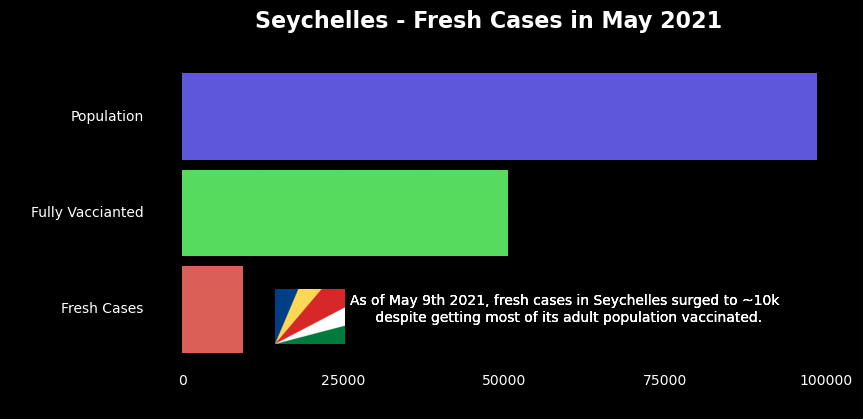

In [23]:
op.figure_size=(9, 4)
p = (ggplot(seychelles_may_2021)         
 + aes(y='value', x='indicator',fill='indicator') 
 + geom_text(x=1, y = 59676.0, label='As of May 9th 2021, fresh cases in Seychelles surged to ~10k \n despite getting most of its adult population vaccinated.',size=10,nudge_y=0.25,nudge_x=0.9,color='white')
 + geom_col(size=3)
 + coord_flip()
 + labs(title = "Seychelles - Fresh Cases in May 2021")
 + theme(
    panel_background = element_rect(fill = "black"),    
    plot_background = element_rect(fill = "black", color = "black"),
    legend_background = element_rect(fill = "black"),
    legend_position='none',
    panel_grid = element_line(size = 0.01),
    legend_text = element_text(color = "white"),
    axis_title_x = None,
    axis_text_y = element_text(color = "white", size = 10),
    axis_text_x = element_text(color = "white", size = 10),
    plot_title = element_text(color = "white", face = "bold", size = 16, hjust = 4, margin={'b': 20, 't':10}),
    panel_spacing_x = 1
  )
)

fig = p.draw()
sc = plt.imread('https://raw.githubusercontent.com/vineethbabu/coronavaccine_images/main/SC_70x55.png')
fig.figimage(sc, xo=275, yo=75, alpha=1, norm=None, cmap=None, vmin=None, vmax=None, origin=None, resize=False)
fig.show()

As per reports covid-19 has surged in Seychelles, an archipelago of 115 islands in the Indian Ocean. It is vaccinated with Sinopharm and Covishield and nearly 60% of its population is fully vaccinated. It has to be seen as to how it progresses in coming days.

In [24]:
rename_country = ["England" , "Wales" , "Scotland" , "Northern Ireland"]

for i in rename_country:
     vaccination_data["country"] = vaccination_data["country"].str.replace(i , "United Kingdom")

In [25]:
def convert_df_with_continent(df):
    
    df['continent'] = ['']*df.shape[0]
    
    def continent_name_convert(name):
        if name == 'AF':
            return 'Africa'
        elif name == 'EU':
            return 'Europe'
        elif name == 'NA':
            return 'NA'
        elif name == 'SA':
            return 'SA'
        elif name == 'OC':
            return 'Oceania'
        elif name == 'AS':
            return 'Asia'

    for i in range(df.shape[0]):
        country = df['country'].iloc[i]
        try:
            country_code = pc.country_name_to_country_alpha2(country, cn_name_format="default")
            continent_name = pc.country_alpha2_to_continent_code(country_code)
            continent_name_full = continent_name_convert(continent_name)
            df['continent'].iloc[i] = continent_name_full
    #         print(f'{country} - {continent_name}')
        except:
            if country == "Cote d'Ivoire":
                continent_name = 'AF'
                continent_name_full = continent_name_convert(continent_name)
                df['continent'].iloc[i] = continent_name_full
            elif country == 'Faeroe Islands':
                continent_name = 'EU'
                continent_name_full = continent_name_convert(continent_name)
                df['continent'].iloc[i] = continent_name_full
            elif country == 'Kosovo':
                continent_name = 'EU'
                continent_name_full = continent_name_convert(continent_name)
                df['continent'].iloc[i] = continent_name_full
            elif country == 'Saint Helena':
                continent_name = 'AF'
                continent_name_full = continent_name_convert(continent_name)
                df['continent'].iloc[i] = continent_name_full
            elif country == 'Curacao':
                continent_name = 'SA'
                continent_name_full = continent_name_convert(continent_name)  
                df['continent'].iloc[i] = continent_name_full
            elif country == 'Timor':
                continent_name = 'AS'
                continent_name_full = continent_name_convert(continent_name)
                df['continent'].iloc[i] = continent_name_full
            elif country == 'Democratic Republic of Congo':
                continent_name = 'AF'
                continent_name_full = continent_name_convert(continent_name)
                df['continent'].iloc[i] = continent_name_full
            else:
                print(f'{country} mistake detected')
        continue
    return df

In [26]:
def population_agg(df):
    df['population'] = ['']*df.shape[0]
    for i in range(df.shape[0]):
        country = df['country'].iloc[i]
        try:
            population = population_data.loc[population_data['Country (or dependency)'] == country]['Population (2020)'].values[0]
            df['population'].iloc[i] = population
        except Exception as e:
            df['population'].iloc[i] = np.nan
            continue
    return df

In [27]:
def stack_population_df_fully_vaccinated(df):
    df_new = pd.DataFrame(columns=['country','vaccination_status','total_vaccinations'])
    df_new['country'] = ['']*2*df.shape[0]
    df_new['vaccination_status'] = ['']*2*df.shape[0]
    df_new['total_vaccinations'] = ['']*2*df.shape[0]
    index = 0
    for i in range(df.shape[0]):
        df_new.iloc[index] = [df['country'].iloc[i],'vaccinated',df['people_fully_vaccinated'].iloc[i]]
        df_new.iloc[index+1] = [df['country'].iloc[i],'not_vaccinated',int(df['population'].iloc[i])-int(df['people_fully_vaccinated'].iloc[i])]
        index += 2
    return df_new

In [28]:
def format_number(number):
    return ("{:,}".format(number))

Percentage of Vaccination yet to be done to achieve Herd Immunity

In [29]:
countries_list = ['United States','United Kingdom','India',"Israel",'Brazil']
herd_immunity = pd.DataFrame()
for i in range(vaccination_data.shape[0]):
    if vaccination_data['country'].iloc[i] in countries_list:
        herd_immunity = herd_immunity.append(vaccination_data.iloc[i])
        
herd_immunity_df = pd.DataFrame(herd_immunity.groupby('country')['people_fully_vaccinated_per_hundred'].max())
herd_immunity_df['herd_immune_percent'] = ['']*herd_immunity_df.shape[0] 
for i in range(herd_immunity_df.shape[0]):
    herd_immunity_df['herd_immune_percent'].iloc[i] = round(70 - herd_immunity_df['people_fully_vaccinated_per_hundred'].iloc[i],2)
herd_immunity_df = herd_immunity_df.reset_index()
herd_immunity_df = population_agg(herd_immunity_df)
for i in range(herd_immunity_df.shape[0]):
    herd_immunity_df['population'].iloc[i] = format_number(round(herd_immunity_df['population'].iloc[i] * (herd_immunity_df['herd_immune_percent'].iloc[i]/100)))

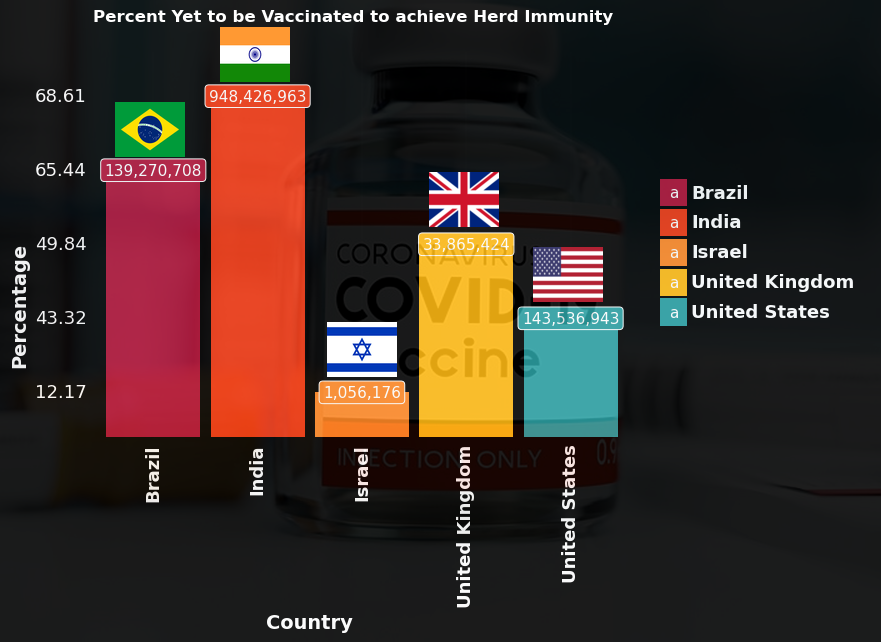

In [30]:
op.figure_size=(7,5)
ax = (ggplot(herd_immunity_df)         
 + aes(x='country', y='herd_immune_percent',fill='country')    
 + geom_col(size=15)
 + geom_label(aes(label = 'population'),color = "white",label_padding= 0.25,size=11)
 + scale_fill_manual(values = ["#B21236","#F03812","#FE8826","#FEB914","#2C9FA2","#002C2B","#F7E1C0"])
 + labs(title = "Percent Yet to be Vaccinated to achieve Herd Immunity")
 + labs(y = "Percentage", x = "Country")
 + theme(
    panel_background = element_rect(fill = "black"),    
    plot_background = element_rect(fill = "black", color = "black"),
    legend_background = element_rect(fill = "black"),
    legend_key = element_blank(),
   
    panel_grid = element_line(size = 0.01),
    panel_grid_minor_y = element_blank(),
    panel_grid_major_y = element_blank(),
    
    legend_text = element_text(color = "white", size=13,face='bold'),
    axis_text_x = element_text(color = "white", size = 13,angle=90,face='bold'),
    axis_text_y = element_text(color = "white", size = 13, hjust = 1, margin={'b': 20, 't':10}),
    axis_title = element_text(color = "white", size = 14, hjust = 1,face = "bold"),
    plot_title = element_text(color = "white", face = "bold", size = 12, hjust = 4, margin={'b': 20, 't':10}),
    panel_spacing_x = 1
  )
)

fig = ax.draw()


image = plt.imread('https://raw.githubusercontent.com/vineethbabu/coronavaccine_images/main/16_1.png')
ind = image_resize('https://raw.githubusercontent.com/google/region-flags/gh-pages/png/IN.png')
brz = image_resize('https://raw.githubusercontent.com/google/region-flags/gh-pages/png/BR.png')
isr = image_resize('https://raw.githubusercontent.com/google/region-flags/gh-pages/png/IL.png')
usa = plt.imread('https://raw.githubusercontent.com/vineethbabu/coronavaccine_images/main/US_70x55.png')
uk = plt.imread('https://raw.githubusercontent.com/vineethbabu/coronavaccine_images/main/GB_70x55.png')
fig.figimage(image, xo=0, yo=0, alpha=0.12, norm=None, cmap=None, vmin=None, vmax=None, origin=None, resize=False)
fig.figimage(ind, xo=220, yo=560, alpha=1, norm=None, cmap=None, vmin=None, vmax=None, origin=None, resize=False)
fig.figimage(brz, xo=115, yo=485, alpha=1, norm=None, cmap=None, vmin=None, vmax=None, origin=None, resize=False)
fig.figimage(isr, xo=327, yo=265, alpha=1, norm=None, cmap=None, vmin=None, vmax=None, origin=None, resize=False)
fig.figimage(uk, xo=429, yo=415, alpha=1, norm=None, cmap=None, vmin=None, vmax=None, origin=None, resize=False)
fig.figimage(usa, xo=533, yo=340, alpha=1, norm=None, cmap=None, vmin=None, vmax=None, origin=None, resize=False)
fig.show()

Herd Immunity is said to be achieved when 70-75% of population is vaccinated. Here I wanted to visualise how much percentage of population is yet to be vaccinated to achieve that target and what in absolute value that would mean in terms of population of that country.

Daily Vaccination Progress In Top Nations From Each Continent

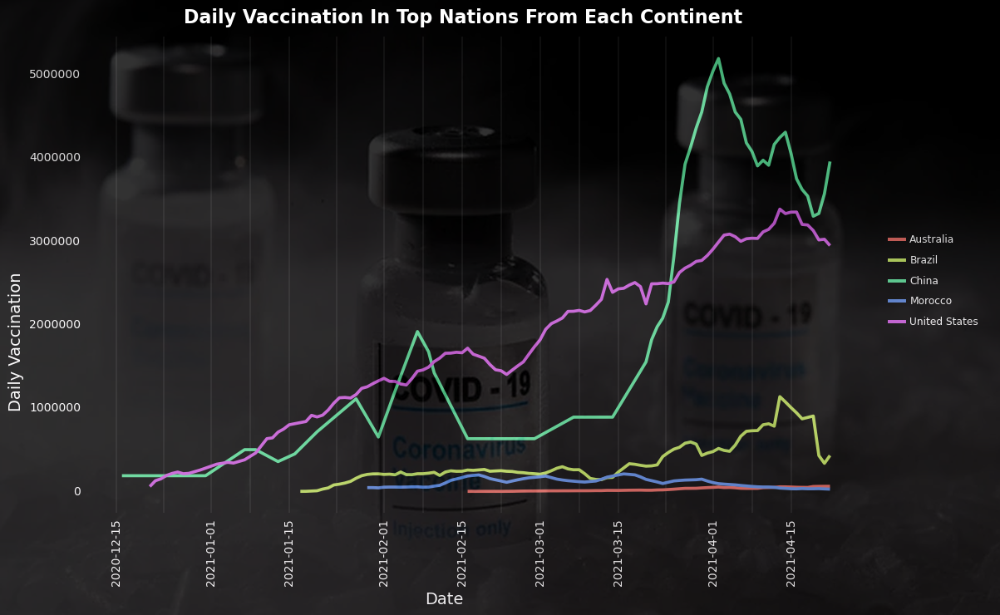

In [31]:
vaccination_data = convert_df_with_continent(vaccination_data)
daily_vaccinations = vaccination_data[['country','total_vaccinations','continent']]
daily_vaccine_df = pd.DataFrame(daily_vaccinations.groupby('continent')['total_vaccinations'].max().sort_values(ascending = False))
daily_vaccine_df = daily_vaccine_df.reset_index()
daily_vaccine_df_continent = pd.DataFrame(columns=['country','date','daily_vaccinations'])
for i in range(daily_vaccine_df.shape[0]):
    df = vaccination_data[(vaccination_data.continent==daily_vaccine_df['continent'].iloc[i]) & (vaccination_data.total_vaccinations==daily_vaccine_df['total_vaccinations'].iloc[i])]
    if df['country'].iloc[0] != 'United Kingdom':
        daily_vaccine_df_continent = daily_vaccine_df_continent.append(vaccination_data[(vaccination_data.country==df['country'].iloc[0])])
daily_vaccine_df_continent = daily_vaccine_df_continent[['country','date','daily_vaccinations']]
daily_vaccine_df_continent = daily_vaccine_df_continent.dropna(how='any',axis=0)
daily_vaccine_df_continent['date']= pd.to_datetime(daily_vaccine_df_continent['date'])
daily_vaccine_df_continent['daily_vaccinations'] = daily_vaccine_df_continent['daily_vaccinations'].astype(int)
op.figure_size=(12, 12)
p = (ggplot(daily_vaccine_df_continent)         
 + aes(y='daily_vaccinations', x='date',color='country')    
 + geom_line(size=1.5) 
 + scale_fill_manual(values = ["#B21236","#723240","#FE8826","#FEB914","#2C9FA2","#002C2B"])
#  + facet_wrap('country')
 + labs(title = "Daily Vaccination In Top Nations From Each Continent")
 + labs(y = "Daily Vaccination", x = "Date")
 + theme(
    panel_background = element_rect(fill = "black"),    
    plot_background = element_rect(fill = "black", color = "black"),
    legend_background = element_rect(fill = "black"),
    legend_key = element_blank(),
   
    panel_grid = element_line(size = 0.1),
    panel_grid_minor_y = element_blank(),
    panel_grid_major_y = element_blank(),
    
    legend_text = element_text(color = "white"),
    axis_text_x = element_text(color = "white", size = 10,angle=90),
    axis_text_y = element_text(color = "white", size = 10),
    axis_title = element_text(color = "white", size = 14, hjust = 1),
    plot_title = element_text(color = "white", face = "bold", size = 16, hjust = 4, margin={'b': 20, 't':10}),
    panel_spacing_x = 1
  )
)

fig = p.draw()

image = plt.imread('https://raw.githubusercontent.com/vineethbabu/coronavaccine_images/main/14_1.png')

fig.figimage(image, xo=0, yo=0, alpha=0.2, norm=None, cmap=None, vmin=None, vmax=None, origin=None, resize=True)

fig.show()

A comparison of daily vaccinations from top nations by total vaccination count from each continent.Here we can see how US and China compare in terms of daily vaccinations.

Top 20 Vaccinated Countries by Total Vaccinations

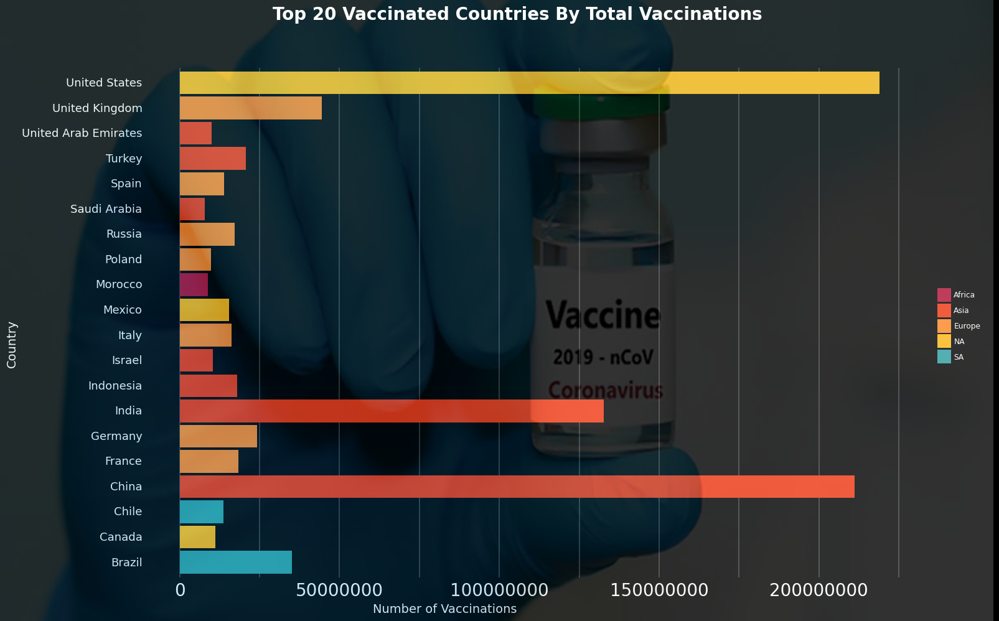

In [32]:
top_20_countries_vaccinated = pd.DataFrame(vaccination_data.groupby("country")["total_vaccinations"].max().sort_values(ascending = False).head(20))
top_20_countries_vaccinated.reset_index(level=0,inplace=True)
top_20_countries_vaccinated = convert_df_with_continent(top_20_countries_vaccinated)
top_20_countries_vaccinated['number_labels'] = ['']*top_20_countries_vaccinated.shape[0]

for i in range(top_20_countries_vaccinated.shape[0]):
    top_20_countries_vaccinated['number_labels'].iloc[i] = format_number(top_20_countries_vaccinated['total_vaccinations'].iloc[i])
    
op.figure_size=(8,5)
ax = (ggplot(top_20_countries_vaccinated)         
 + aes(x='country', y='total_vaccinations',fill='continent')    
 + geom_col(size=20)
#  + geom_label(aes(label = 'number_labels'),ha='right',color = "white",label_padding= 0.25)
 + coord_flip()
 + scale_fill_manual(values = ["#B21236","#F03812","#FE8826","#FEB914","#2C9FA2","#002C2B","#F7E1C0"])
 + labs(title = "Top 20 Vaccinated Countries By Total Vaccinations")
 + labs(y = "Number of Vaccinations", x = "Country")
 + theme(
    panel_background = element_rect(fill = "black"),    
    plot_background = element_rect(fill = "black", color = "black"),
    legend_background = element_rect(fill = "black"),
    legend_key = element_blank(),
   
    panel_grid = element_line(size = 0.3),
    panel_grid_minor_y = element_blank(),
    panel_grid_major_y = element_blank(),
    
    legend_text = element_text(color = "white"),
    axis_text_x = element_text(color = "white", size = 20),
    axis_text_y = element_text(color = "white", size = 13, hjust = 1, margin={'b': 20, 't':10}),
    axis_title = element_text(color = "white", size = 14, hjust = 1),
    plot_title = element_text(color = "white", face = "bold", size = 20, hjust = 4, margin={'b': 20, 't':10}),
    panel_spacing_x = 1
  )
)

fig = ax.draw()

image = plt.imread('https://raw.githubusercontent.com/vineethbabu/coronavaccine_images/main/1_enlargev3.png')

fig.figimage(image, xo=0, yo=0, alpha=0.2, norm=None, cmap=None, vmin=None, vmax=None, origin=None, resize=True)

fig.show()

USA has the most total vaccinations count followed by China, India, UK. Here we have7 Asian, 7 European, 3 North American, 2 South American, 1 Afriacn countries.

Top 20 Countries Based on People Vaccinated

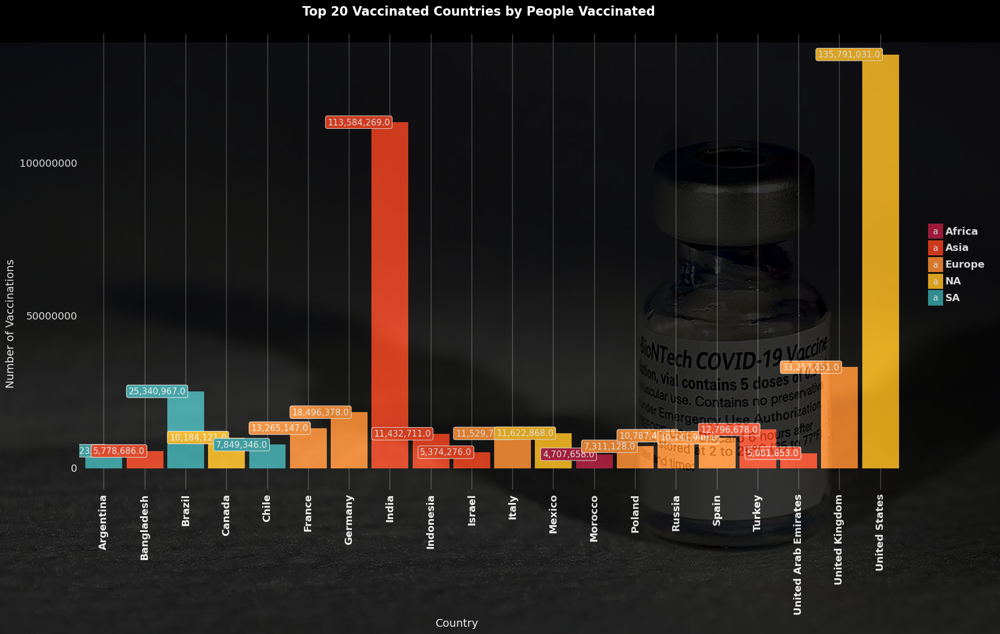

In [33]:
top_20_countries_people_vaccinated = pd.DataFrame(vaccination_data.groupby("country")["people_vaccinated"].max().sort_values(ascending = False).head(20))
top_20_countries_people_vaccinated.reset_index(level=0,inplace=True)
top_20_countries_people_vaccinated = convert_df_with_continent(top_20_countries_people_vaccinated)
top_20_countries_people_vaccinated['number_labels'] = ['']*top_20_countries_people_vaccinated.shape[0]

for i in range(top_20_countries_people_vaccinated.shape[0]):
    top_20_countries_people_vaccinated['number_labels'].iloc[i] = format_number(top_20_countries_people_vaccinated['people_vaccinated'].iloc[i])
    
op.figure_size=(8,10)
ax = (ggplot(top_20_countries_people_vaccinated)         
 + aes(x='country', y='people_vaccinated',fill='continent')    
 + geom_col(size=15)
 + geom_label(aes(label = 'number_labels'),ha='right',color = "white",label_padding= 0.25,size=11)
 + scale_fill_manual(values = ["#B21236","#F03812","#FE8826","#FEB914","#2C9FA2","#002C2B","#F7E1C0"])
 + labs(title = "Top 20 Vaccinated Countries by People Vaccinated")
 + labs(y = "Number of Vaccinations", x = "Country")
 + theme(
    panel_background = element_rect(fill = "black"),    
    plot_background = element_rect(fill = "black", color = "black"),
    legend_background = element_rect(fill = "black"),
    legend_key = element_blank(),
   
    panel_grid = element_line(size = 0.3),
    panel_grid_minor_y = element_blank(),
    panel_grid_major_y = element_blank(),
    
    legend_text = element_text(color = "white", size=13,face='bold'),
    axis_text_x = element_text(color = "white", size = 13,angle=90,face='bold'),
    axis_text_y = element_text(color = "white", size = 13, hjust = 1, margin={'b': 20, 't':10}),
    axis_title = element_text(color = "white", size = 14, hjust = 1),
    plot_title = element_text(color = "white", face = "bold", size = 16, hjust = 4, margin={'b': 20, 't':10}),
    panel_spacing_x = 1
  )
)

fig = ax.draw()

image = plt.imread('https://raw.githubusercontent.com/vineethbabu/coronavaccine_images/main/8_enlargev2.png')

fig.figimage(image, xo=0, yo=0, alpha=0.2, norm=None, cmap=None, vmin=None, vmax=None, origin=None, resize=True)

fig.show()


We can see here the total vaccinated people in top 20 countries. USA again tops the list with nearly 120 million people vaccinated. Followed by India, UK, Brazil.

Now lets see not vaccinated poplutation from each of these countries to get a better picture.


Top 20 Vaccinated Countries based on People Fully Vacccinated

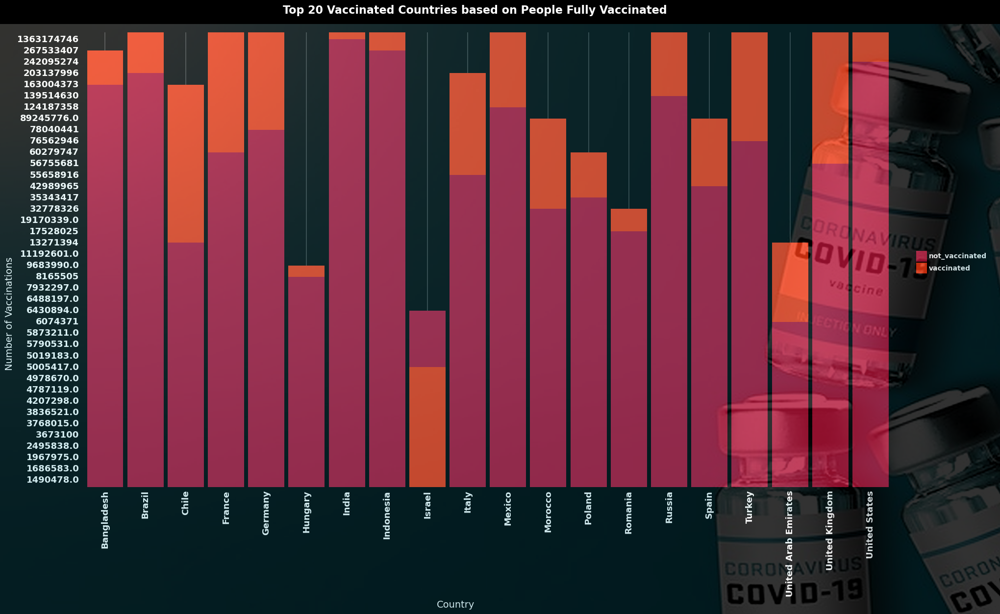

In [34]:
top_20_countries_people_fully_vaccinated = pd.DataFrame(vaccination_data.groupby("country")["people_fully_vaccinated"].max().sort_values(ascending = False).head(20))
top_20_countries_people_fully_vaccinated.reset_index(level=0,inplace=True)
top_20_countries_people_fully_vaccinated = convert_df_with_continent(top_20_countries_people_fully_vaccinated)
top_20_countries_people_fully_vaccinated = population_agg(top_20_countries_people_fully_vaccinated)
top_20_countries_people_fully_vaccinated = stack_population_df_fully_vaccinated(top_20_countries_people_fully_vaccinated)


op.figure_size=(8,10)
ax = (ggplot(top_20_countries_people_fully_vaccinated)         
 + aes(x='country', y='total_vaccinations',fill='vaccination_status')    
 + geom_col(size=20)
 + scale_fill_manual(values = ["#B21236","#F03812","#FE8826","#FEB914","#2C9FA2","#002C2B","#F7E1C0"])
 + labs(title = "Top 20 Vaccinated Countries based on People Fully Vaccinated")
 + labs(y = "Number of Vaccinations", x = "Country")
 + theme(
    panel_background = element_rect(fill = "black"),    
    plot_background = element_rect(fill = "black", color = "black"),
    legend_background = element_rect(fill = "black"),
    legend_key = element_blank(),
   
    panel_grid = element_line(size = 0.3),
    panel_grid_minor_y = element_blank(),
    panel_grid_major_y = element_blank(),
    
    legend_text = element_text(color = "white",size = 10,face = "bold"),
    axis_text_x = element_text(color = "white", size = 13,angle=90,face = "bold"),
    axis_text_y = element_text(color = "white", size = 13, hjust = 1, margin={'b': 20, 't':10},face = "bold"),
    axis_title = element_text(color = "white", size = 14, hjust = 1),
    plot_title = element_text(color = "white", face = "bold", size = 16, hjust = 4, margin={'b': 20, 't':10}),
    panel_spacing_x = 1
  )
)

fig = ax.draw()

image = plt.imread('https://raw.githubusercontent.com/vineethbabu/coronavaccine_images/main/11_enlargev1.png')

fig.figimage(image, xo=0, yo=0, alpha=0.2, norm=None, cmap=None, vmin=None, vmax=None, origin=None, resize=True)

fig.show()


We can clearly see that all of these counties still have a lot of not vaccinated population.It is clearly evident from this plot specially for heavily populated county like India.

Israel stands out as the country that has more vaccinated than not vaccinated.


Top 20 Vaccinated Countries based on People Fully Vacccinated per Hundred

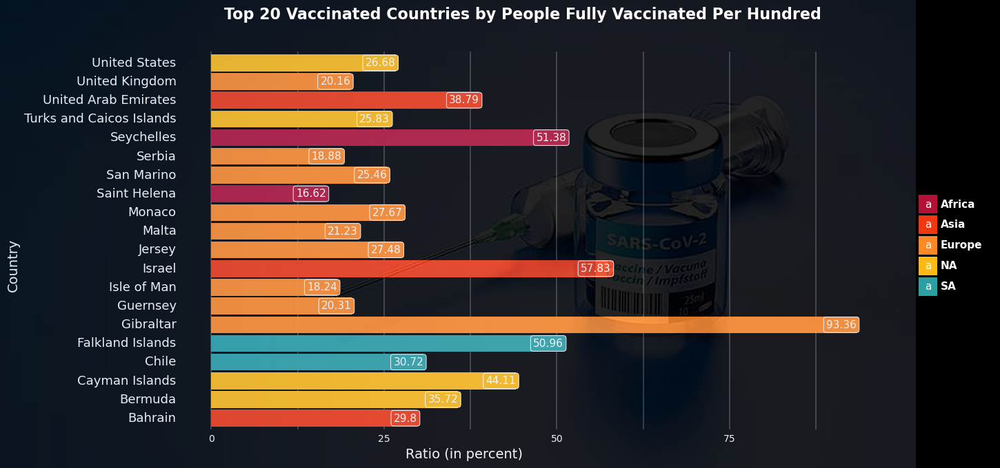

In [35]:
top_20_countries_pfvph = pd.DataFrame(vaccination_data.groupby("country")["people_fully_vaccinated_per_hundred"].max().sort_values(ascending = False).head(20))
top_20_countries_pfvph.reset_index(level=0,inplace=True)
top_20_countries_pfvph = convert_df_with_continent(top_20_countries_pfvph)

top_20_countries_pfvph['number_labels'] = ['']*top_20_countries_pfvph.shape[0]

for i in range(top_20_countries_pfvph.shape[0]):
    top_20_countries_pfvph['number_labels'].iloc[i] = format_number(top_20_countries_pfvph['people_fully_vaccinated_per_hundred'].iloc[i])
op.figure_size=(5,5)
ax = (ggplot(top_20_countries_pfvph)         
 + aes(x='country', y='people_fully_vaccinated_per_hundred',fill='continent')    
 + geom_col(size=13)
 + geom_label(aes(label = 'number_labels'),ha='right',color = "white",label_padding= 0.25)
 + coord_flip()
 + scale_fill_manual(values = ["#B21236","#F03812","#FE8826","#FEB914","#2C9FA2","#002C2B","#F7E1C0"])
 + labs(title = "Top 20 Vaccinated Countries by People Fully Vaccinated Per Hundred")
 + labs(y = "Ratio (in percent)", x = "Country")
 + theme(
    panel_background = element_rect(fill = "black"),    
    plot_background = element_rect(fill = "black", color = "black"),
    legend_background = element_rect(fill = "black"),
    legend_key = element_blank(),
   
    panel_grid = element_line(size = 0.3),
    panel_grid_minor_y = element_blank(),
    panel_grid_major_y = element_blank(),
    
    legend_text = element_text(color = "white",size=11,face='bold'),
    axis_text_x = element_text(color = "white", size = 10),
    axis_text_y = element_text(color = "white", size = 13, hjust = 1, margin={'b': 20, 't':10}),
    axis_title = element_text(color = "white", size = 14, hjust = 1),
    plot_title = element_text(color = "white", face = "bold", size = 16, hjust = 4, margin={'b': 20, 't':10}),
    panel_spacing_x = 1
  )
)

fig = ax.draw()

image = plt.imread('https://raw.githubusercontent.com/vineethbabu/coronavaccine_images/main/12.png')

fig.figimage(image, xo=0, yo=0, alpha=0.15, norm=None, cmap=None, vmin=None, vmax=None, origin=None, resize=True)

fig.show()


In top countries with people fully vaccinated per hundred we have

    Gibraltar - Europe
    Israel - Asia
    Seychelles - Africa
    Falkland Islands - South America
    Cayman Islands - North America

Gibraltar has vaccinated almost all of its adult population.
More than half of the population is vaccinated in Israel, Seychelles and Falkland Islands.

Total Vaccinations of each Vaccine

In [36]:
vaccine_manufacture = pd.read_csv("E:/github/COVID-19 World Vaccination Progress/country_vaccinations_by_manufacturer.csv")

vaccine_counts = pd.DataFrame(vaccine_manufacture.groupby("vaccine")["total_vaccinations"].max().sort_values(ascending = False))
vaccine_counts.reset_index(level=0,inplace=True)

vaccine_counts['number_labels'] = ['']*vaccine_counts.shape[0]

for i in range(vaccine_counts.shape[0]):
    vaccine_counts['number_labels'].iloc[i] = format_number(vaccine_counts['total_vaccinations'].iloc[i])

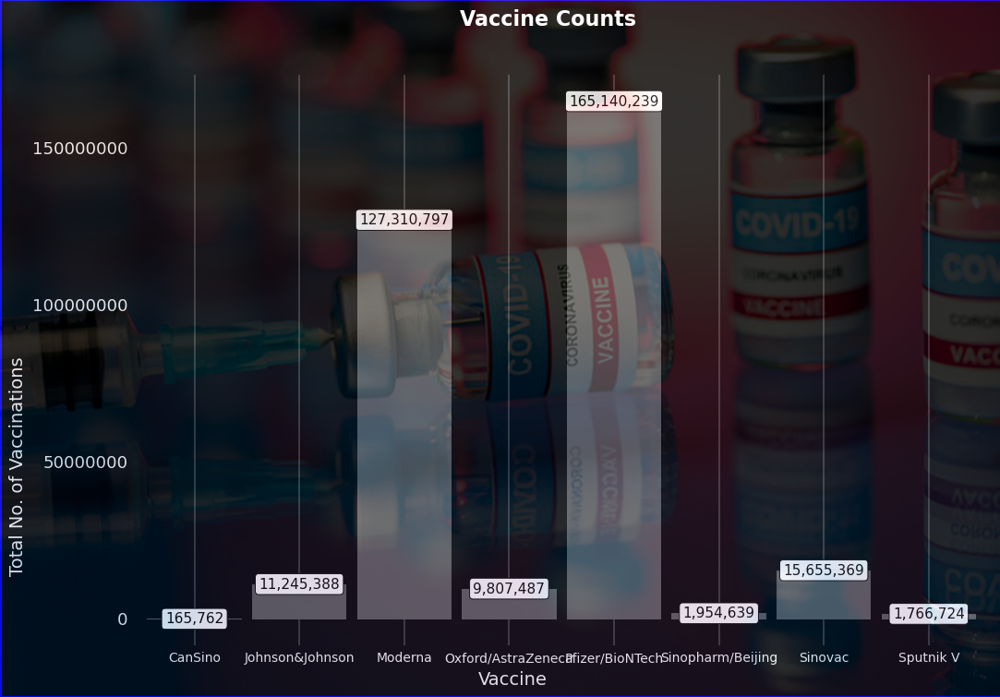

In [37]:
op.figure_size=(8,5)
ax = (ggplot(vaccine_counts)         
 + aes(x='vaccine', y='total_vaccinations')    
 + geom_col(size=15)
 + geom_label(aes(label = 'number_labels'),ha='center',color = "black",label_padding= 0.25)
 + scale_fill_manual(values = ["#B21236","#F03812","#FE8826","#FEB914","#2C9FA2","#002C2B","#F7E1C0"])
 + labs(title = "Vaccine Counts")
 + labs(y = "Total No. of Vaccinations", x = "Vaccine")
 + theme(
    panel_background = element_rect(fill = "black"),    
    plot_background = element_rect(fill = "black", color = "blue"),
    legend_background = element_rect(fill = "black"),
    legend_key = element_blank(),
   
    panel_grid = element_line(size = 0.3),
    panel_grid_minor_y = element_blank(),
    panel_grid_major_y = element_blank(),
    
    legend_text = element_text(color = "white"),
    axis_text_x = element_text(color = "white", size = 10),
    axis_text_y = element_text(color = "white", size = 13, hjust = 1, margin={'b': 20, 't':10}),
    axis_title = element_text(color = "white", size = 14, hjust = 1),
    plot_title = element_text(color = "white", face = "bold", size = 16, hjust = 4, margin={'b': 20, 't':10}),
    panel_spacing_x = 1
  )
)

fig = ax.draw()

image = plt.imread('https://raw.githubusercontent.com/vineethbabu/coronavaccine_images/main/4.png')

fig.figimage(image, xo=0, yo=0, alpha=0.2, norm=None, cmap=None, vmin=None, vmax=None, origin=None, resize=True)

fig.show()


The total number of vaccinations of each vaccine are:

    Pfizer/BioNTech - 134.1 M
    Moderna - 109 M
    Sinovac - 13 M
    Oxford/AstraZeneca - 6 M
    Johnson&Jonson - 8.6 M


Top 50 Highest Vaccinated Countries Count in each Continent

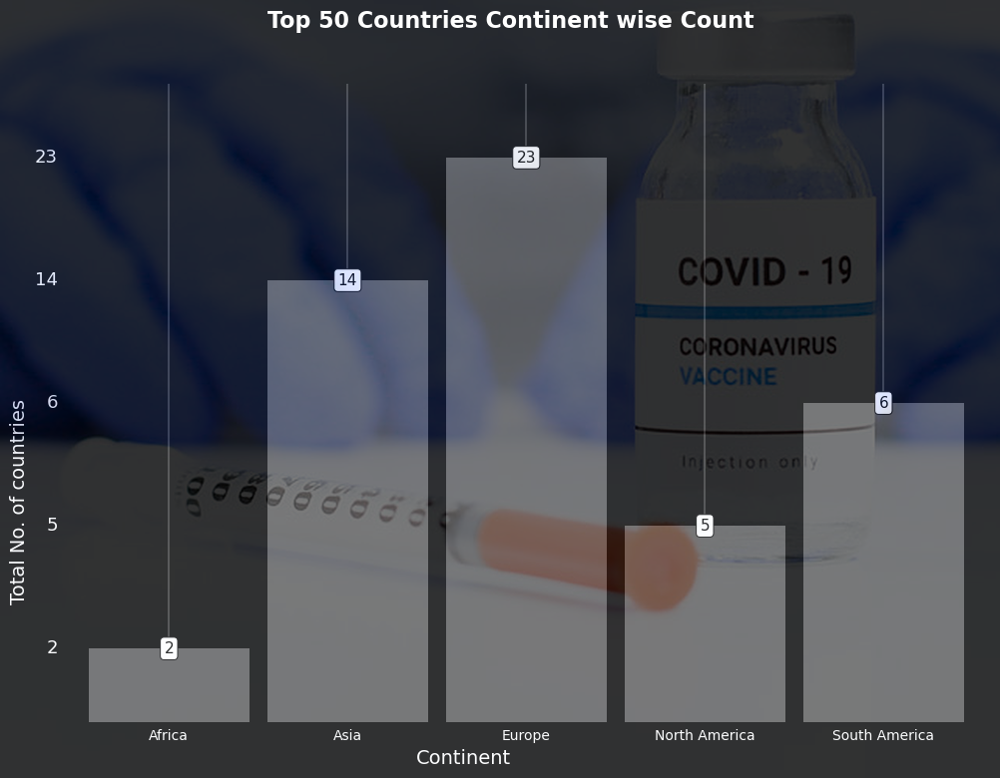

In [38]:
top_50_countries_people_fully_vaccinated = pd.DataFrame(vaccination_data.groupby("country")["people_fully_vaccinated"].max().sort_values(ascending = False).head(50))
top_50_countries_people_fully_vaccinated.reset_index(level=0,inplace=True)
top_50_countries_people_fully_vaccinated = convert_df_with_continent(top_50_countries_people_fully_vaccinated)
top50_countries_continent_count = pd.DataFrame(top_50_countries_people_fully_vaccinated.groupby('continent')['country'].apply(list))
top50_countries_continent_count['country_count'] = ['']*top50_countries_continent_count.shape[0]
top50_countries_continent_count.reset_index(level=0,inplace=True)

for i in range(top50_countries_continent_count.shape[0]):
    top50_countries_continent_count['country_count'].iloc[i] = len(top50_countries_continent_count['country'].iloc[i])
    if top50_countries_continent_count['continent'].iloc[i] == 'NA':
        top50_countries_continent_count['continent'].iloc[i] = 'North America'
    elif top50_countries_continent_count['continent'].iloc[i] == 'SA':
        top50_countries_continent_count['continent'].iloc[i] = 'South America'

op.figure_size=(8,5)
ax = (ggplot(top50_countries_continent_count)         
 + aes(x='continent', y='country_count')    
 + geom_col(size=15)
 + geom_label(aes(label = 'country_count'),ha='center',color = "black",label_padding= 0.25)
 + scale_fill_manual(values = ["#B21236","#F03812","#FE8826","#FEB914","#2C9FA2","#002C2B","#F7E1C0"])
 + labs(title = "Top 50 Countries Continent wise Count")
 + labs(y = "Total No. of countries", x = "Continent")
 + theme(
    panel_background = element_rect(fill = "black"),    
    plot_background = element_rect(fill = "black", color = "black"),
    legend_background = element_rect(fill = "black"),
    legend_key = element_blank(),
   
    panel_grid = element_line(size = 0.3),
    panel_grid_minor_y = element_blank(),
    panel_grid_major_y = element_blank(),
    
    legend_text = element_text(color = "white"),
    axis_text_x = element_text(color = "white", size = 10),
    axis_text_y = element_text(color = "white", size = 13, hjust = 1, margin={'b': 20, 't':10}),
    axis_title = element_text(color = "white", size = 14, hjust = 1),
    plot_title = element_text(color = "white", face = "bold", size = 16, hjust = 4, margin={'b': 20, 't':10}),
    panel_spacing_x = 1
  )
)

fig = ax.draw()

image = plt.imread('https://raw.githubusercontent.com/vineethbabu/coronavaccine_images/main/7.png')

fig.figimage(image, xo=0, yo=0, alpha=0.2, norm=None, cmap=None, vmin=None, vmax=None, origin=None, resize=True)

fig.show()


Top 50 countries continent wise count:

    22 European, 17 Asian, 6 South American, 4 North America, 1 African countries.


Least Fully Vaccinated People Per Hundred Country in a Continent

In [39]:
countries_pfvph = pd.DataFrame(vaccination_data.groupby("country")["people_fully_vaccinated_per_hundred"].max().sort_values(ascending = False))
countries_pfvph.reset_index(level=0,inplace=True)
countries_pfvph = convert_df_with_continent(countries_pfvph)
# bottom_20_countries_pfvph.groupby('continent', as_index=False).apply(lambda x: x.loc[x.people_fully_vaccinated_per_hundred.argmin(),])
bottom_20_countries_pfvph = pd.DataFrame(countries_pfvph.groupby("continent")["people_fully_vaccinated_per_hundred"].min())
bottom_20_countries_pfvph['country'] = ['']*bottom_20_countries_pfvph.shape[0]
bottom_20_countries_pfvph.reset_index(level=0,inplace=True)
for i in range(bottom_20_countries_pfvph.shape[0]):
    pvfh = bottom_20_countries_pfvph['people_fully_vaccinated_per_hundred'].iloc[i]
    continent = bottom_20_countries_pfvph['continent'].iloc[i]
    bottom_20_countries_pfvph['country'].iloc[i] = countries_pfvph.loc[(countries_pfvph['people_fully_vaccinated_per_hundred']==pvfh) & (countries_pfvph['continent']==continent)]['country'].values[0]
    if bottom_20_countries_pfvph['continent'].iloc[i] == 'NA':
        bottom_20_countries_pfvph['continent'].iloc[i] = 'North America'
    elif bottom_20_countries_pfvph['continent'].iloc[i] == 'SA':
        bottom_20_countries_pfvph['continent'].iloc[i] = 'South America'

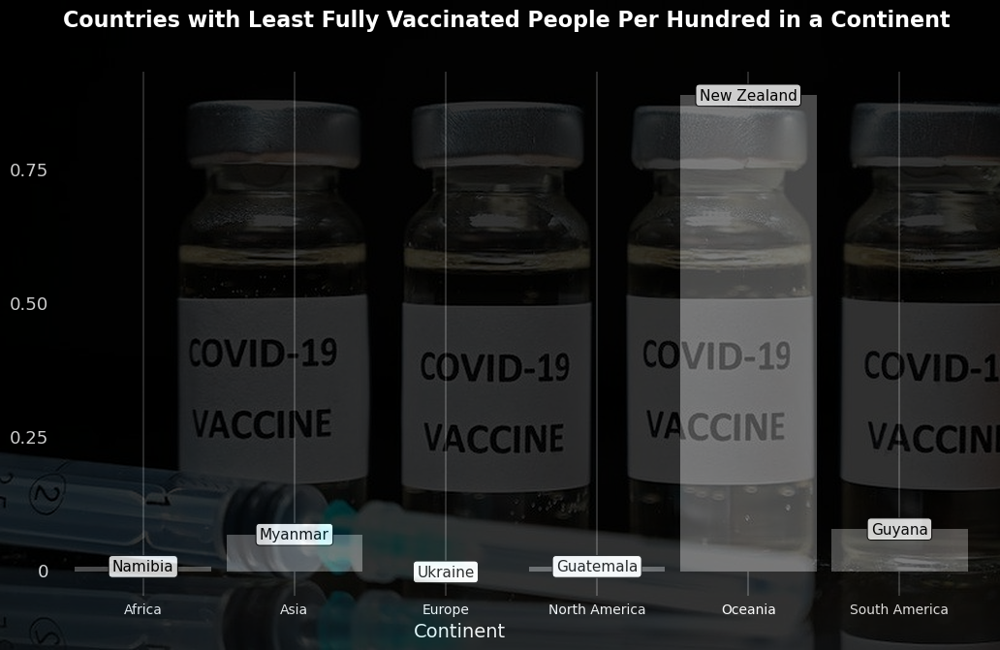

In [40]:
op.figure_size=(8,5)
ax = (ggplot(bottom_20_countries_pfvph)         
 + aes(x='continent', y='people_fully_vaccinated_per_hundred')    
 + geom_col(size=15)
 + geom_label(aes(label = 'country'),ha='center',color = "black",label_padding= 0.25)
 + scale_fill_manual(values = ["#B21236","#F03812","#FE8826","#FEB914","#2C9FA2","#002C2B","#F7E1C0"])
 + labs(title = "Countries with Least Fully Vaccinated People Per Hundred in a Continent")
 + labs(y = "", x = "Continent")
 + theme(
    panel_background = element_rect(fill = "black"),    
    plot_background = element_rect(fill = "black", color = "black"),
    legend_background = element_rect(fill = "black"),
    legend_key = element_blank(),
   
    panel_grid = element_line(size = 0.3),
    panel_grid_minor_y = element_blank(),
    panel_grid_major_y = element_blank(),
    
    legend_text = element_text(color = "white"),
    axis_text_x = element_text(color = "white", size = 10),
    axis_text_y = element_text(color = "white", size = 13, hjust = 1, margin={'b': 20, 't':10}),
    axis_title = element_text(color = "white", size = 14, hjust = 1),
    plot_title = element_text(color = "white", face = "bold", size = 16, hjust = 4, margin={'b': 20, 't':10}),
    panel_spacing_x = 1
  )
)

fig = ax.draw()

image = plt.imread('https://raw.githubusercontent.com/vineethbabu/coronavaccine_images/main/9.png')

fig.figimage(image, xo=0, yo=0, alpha=0.2, norm=None, cmap=None, vmin=None, vmax=None, origin=None, resize=True)

fig.show()


Continent wise countries with least fully vaccinated people:

        Namibia in Africa - 0.05
        Ukraine in Europe - 0.00
        Kyrgyzstan in Asia - 0.01
        Guatemala in North America - 0.01
        Suriname in South America - 0.01
